## <center> Marine heatwave notebook </center>

This notebook contains all the codes used to produce the figures of the study

## Setup

Run this script only once to setup all the necessary modules to generate the figures.

In [1]:
# Enables modules autoreload (important during development)
%load_ext autoreload
%autoreload 2

# Basic imports
import os

import numpy as np
import xarray as xr
import matplotlib.pyplot as plt

import pymannkendall as mk

import pyscripts.options as opts
import pyscripts.utils as utils

# Define basic paths that may be useful
root_path = os.path.join(os.path.abspath(os.getcwd()), '..')
print(root_path)

def fig_path(no): return os.path.join(root_path, 'Figuras', f'figure_{no}.png')

/LOCALDATA/ARTHURs_FILES/Codigos/..


In [2]:
from pyscripts.load_save_dataset import load_mhws_dataset, load_bathy

# Load the two MHW annual indices dataset that were computed with REP and MEDREA respectively
ds_mhws_rep = load_mhws_dataset("yearly", "rep", False, "balears", (1987,2021))
ds_mhws_medrea = load_mhws_dataset("yearly", "medrea", False, "balears", (1987,2021))
ds_bathy_medrea = load_bathy(source="MEDREA")

# Interpolate bathymetry data onto REP grid
ds_bathy_rep = ds_bathy_medrea.interp(
    lat=ds_mhws_rep.lat,
    lon=ds_mhws_rep.lon,
    method="linear"
)

Loaded MHWs dataset.
Loaded MHWs dataset.
Loaded MEDREA bathymetry dataset.


In [3]:
clim_period = (1987, 2021)

## Figure 1

## Figure 2

In [4]:
from pyscripts.load_save_dataset import load_mhws_dataset

# Loads the region-averaged mhw dataset
ds_mhws_rep_mean = load_mhws_dataset(
    ds_type = 'all_events',
    dataset_used = 'rep_mean',
    detrended = False,
    region = 'balears',
    clim_period = clim_period
)

Loaded MHWs dataset.


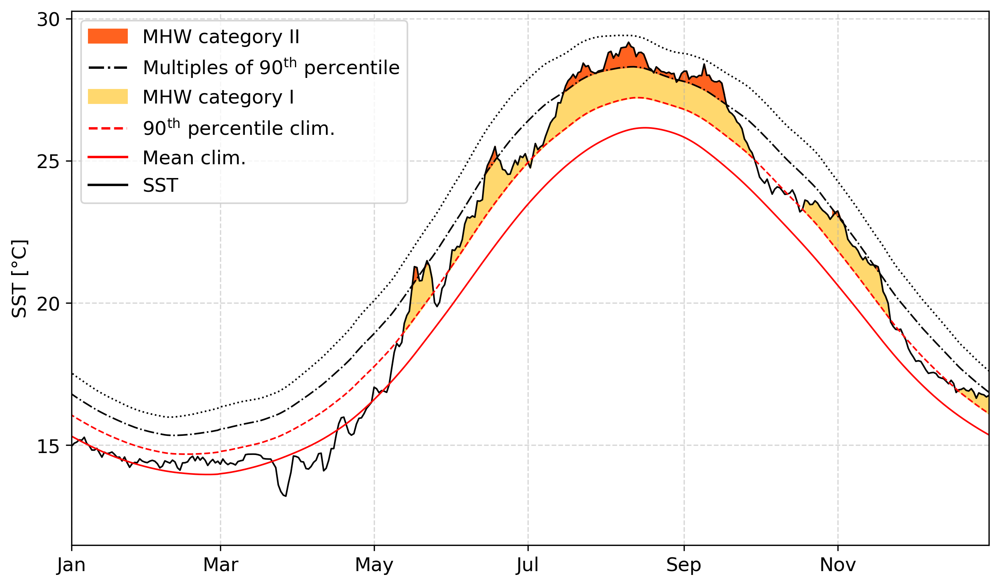

In [5]:
from pyscripts.mhw_computer import get_mhw_ts_from_ds
import matplotlib.pyplot as plt
import numpy as np

from datetime import date
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import scipy.ndimage as ndimage

from pyscripts.basic_plotting import get_locator_from_ticks


yticks = (5,0)
yticks_minor = (2.5,)


# Code
max_thr = 2

with plt.rc_context({'font.size': 12}):
    fig = plt.figure(figsize=(8.6, 5), dpi=300, constrained_layout=True)

    time, mhws = get_mhw_ts_from_ds(ds_mhws_rep_mean, None, None, None)
    
    ax = fig.add_subplot(1, 1, 1)

    # ax.plot(time, mhws["clim_sst"], label="REP-SST", c='k', lw=1, marker='x', markersize=3)
    ax.plot(time, mhws["clim_sst"], label="REP-SST", c='k', lw=1)
    ax.plot(time, mhws["clim_thresh"], label="1987-2021 p90", c='r', ls='--', lw=1)
    ax.plot(time, mhws["clim_seas"], label="1987-2021 mean", c='r', lw=1)


    colors = { 1: '#ffd86e', 2: '#ff621f', 3: '#df391b', 4: '#861a15'}
    lss = { 1: '--', 2: '-.', 3: ':', 4: '..'}


    for i in range(2, max_thr+2):
        mhws[f"clim_{i}thresh"] = mhws["clim_thresh"]*i - mhws["clim_seas"]*(i-1)
        ax.plot(time, mhws[f"clim_{i}thresh"], c="k", alpha=1, ls=lss[i], lw=1) 


    for ev in range(mhws["n_events"]):
        id_slice = slice(mhws["index_start"][ev], mhws["index_end"][ev]+1)
        temp = mhws["clim_sst"][id_slice]
        
        ax.fill_between(
            time[id_slice],
            mhws["clim_thresh"][id_slice],
            np.minimum(
                mhws["clim_sst"][id_slice],
                mhws["clim_2thresh"][id_slice],
            ),
            color='#ffd86e',
        )

        for i in range(2, max_thr+1):
            lower_thr = mhws[f"clim_{i}thresh"][id_slice]
            upper_thr = mhws[f"clim_{i+1}thresh"][id_slice]
            times = time[id_slice]

            exceed_bool = temp - lower_thr
            # exceed_bool[exceed_bool<=0] = False
            # exceed_bool[exceed_bool>0] = True
            exceed_bool = exceed_bool>=0

            events, n_events = ndimage.label(exceed_bool)
            
            for ev_ in range(1,n_events+1):
                slice_ = slice(np.where(events == ev_)[0][0]-1, np.where(events == ev_)[0][-1]+1)

                if times[np.where(events == ev_)[0][0]].astype('datetime64[Y]').astype(int) + 1970 == 2022 and times[np.where(events == ev_)[0][0]].astype('datetime64[M]').astype(int) % 12 + 1 == 12:
                    print(f"Filling Cat {i} from {times[np.where(events == ev_)[0][0]]} to {times[np.where(events == ev_)[0][-1]]}")

                ax.fill_between(
                    times[slice_],
                    lower_thr[slice_],
                    np.minimum(
                        temp[slice_],
                        upper_thr[slice_],
                    ),
                    color=colors[i],
                )

    ax.grid(ls='--', alpha=0.5)
    ax.grid(which='minor', ls='--', alpha=0.3)
    ax.set_ylabel("SST [°C]")

    ax.set_xlim(date(2022, 1, 1), date(2022, 12, 31))
    
    ax.set_xticks(
        [date(2022, mm, 1) for mm in range(1, 13, 2)],
        ['Jan', 'Mar', 'May', 'Jul', 'Sep', 'Nov'],
    )
    # ax.set_xticks(
    #     [date(2022, mm, 1) for mm in range(1, 13)],
    #     minor=True
    # )
    # ax.xaxis.set_major_locator(get_locator_from_ticks(xticks))
    # ax.xaxis.set_minor_locator(get_locator_from_ticks(xticks_minor))

    # ax.set_ylim(12, 18)
    ax.yaxis.set_major_locator(get_locator_from_ticks(yticks))
    # ax.yaxis.set_minor_locator(get_locator_from_ticks(yticks_minor, which='minor'))
    

    # ax.set_title(f"{depth:.0f}m")
    ax.get_legend_handles_labels()

    ax.legend(
        [
            Patch(color='#ff621f'),
            Line2D([0], [0], c='k', ls='-.'),
            Patch(color='#ffd86e'),
            Line2D([0], [0], c='r', ls='--'),
            Line2D([0], [0], c='r'),
            Line2D([0], [0], color='k'),
        ], ["MHW category II", "Multiples of 90$\mathregular{^{th}}$ percentile", "MHW category I", "90$\mathregular{^{th}}$ percentile clim.", "Mean clim.", "SST"],
        # fontsize=10,
        loc='upper left',
    )

plt.show()


## Figure 3

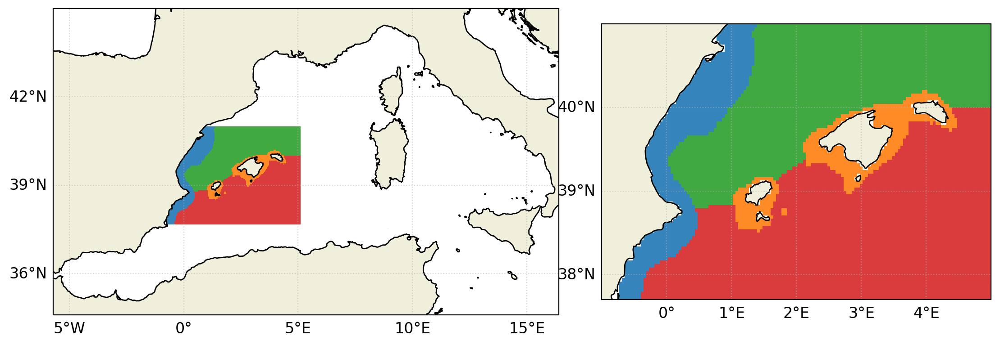

In [ ]:
from pyscripts.basic_plotting import plot_map

from pyscripts.process_data import apply_regional_mask
import cartopy.crs as ccrs

da_regions = xr.full_like(ds_mhws_medrea.isel(depth=0, year=0).total_days, np.nan)

continental_coast_mask = apply_regional_mask(da_regions, 'continental_coast', ds_bathy_medrea, return_mask=True)
balearic_coast_mask = apply_regional_mask(da_regions, 'balearic_coast', ds_bathy_medrea, return_mask=True)
balearic_sea_deep_mask = apply_regional_mask(da_regions, 'balearic_sea_deep', ds_bathy_medrea, return_mask=True)
west_algerian_deep_mask = apply_regional_mask(da_regions, 'west_algerian_deep', ds_bathy_medrea, return_mask=True)

da_regions = da_regions.where(~continental_coast_mask, other=1) # Continental coast
da_regions = da_regions.where(~balearic_coast_mask, other=2) # Balearic coast
da_regions = da_regions.where(~balearic_sea_deep_mask, other=3) # Balearic Sea deep
da_regions = da_regions.where(~west_algerian_deep_mask, other=4) # West Algerian deep


# cmap = 'cmo.deep'

from matplotlib.colors import ListedColormap

alpha = 0.9
cmap = ListedColormap([('C0', alpha), ('C1', alpha), ('C2', alpha), ('C3', alpha)])


# fig, ax = plt.subplots()

fig, ax = plot_map(
    da_regions.lon, da_regions.lat,
    da_regions,
    # fig=fig,ax=ax,
    # figsize=(12,20),
    figsize=(12,4),
    fontsize=12,
    figdpi=200,

    # extent=[-5,14,33,45], ## BEST
    # extent=[-5.7,16.4,33,45],
    extent=[-5.7,16.4,34.6,45],

    add_cbar=False,
    cmap=cmap,
    vmin=1, vmax=4,
    yticks=4,
    xticks=5,

    # show_plots=True,
)

# [-1, 5, 37.7, 41]
x1, x2, y1, y2 = -1, 5, 37.7, 41  # subregion of the original image
axins = ax.inset_axes(
    # [1.12, 0, 1.0, 1.0], ## BEST
    # [1.12, 0.05, 0.9, 0.9],
    [1.02, 0.05, 0.9, 0.9],
    xlim=(x1, x2), ylim=(y1, y2), xticklabels=[], yticklabels=[], projection=ccrs.PlateCarree()
)

plot_map(
    da_regions.lon, da_regions.lat,
    da_regions,

    fig=fig, ax=axins,
    figsize=(8,20),
    fontsize=12,
    figdpi=200,

    # extent='balears',
    extent=None,

    add_cbar=False,
    cmap=cmap,
    vmin=1, vmax=4,
    yticks=4,
    # xticks=4,
    # yticks_minor=2,

    # show_plots=True,
)

# ax.indicate_inset_zoom(axins, edgecolor="black", alpha=1)

plt.show()

In [7]:
ds_mhws_rep

<xarray.Dataset> Size: 75MB
Dimensions:               (lat: 69, lon: 120, year: 42)
Coordinates:
  * lat                   (lat) float32 276B 37.65 37.7 37.75 ... 41.01 41.06
  * lon                   (lon) float32 480B -0.8591 -0.8091 ... 5.046 5.096
  * year                  (year) int64 336B 1982 1983 1984 ... 2021 2022 2023
Data variables: (12/27)
    count                 (lat, lon, year) float64 3MB ...
    total_days            (lat, lon, year) float64 3MB ...
    moderate_days         (lat, lon, year) float64 3MB ...
    strong_days           (lat, lon, year) float64 3MB ...
    severe_days           (lat, lon, year) float64 3MB ...
    extreme_days          (lat, lon, year) float64 3MB ...
    ...                    ...
    rate_onset            (lat, lon, year) float64 3MB ...
    rate_decline          (lat, lon, year) float64 3MB ...
    temp_min              (lat, lon, year) float64 3MB ...
    temp_mean             (lat, lon, year) float64 3MB ...
    temp_max              (lat, lon, year) float64 3MB ...
    mean_thresh           (lat, lon, year) float64 3MB ...
Attributes:
    climatologyPeriod:  1987-2021
    description:        MHWs yearly statistics computed using the marineHeatW...
    acknowledgment:     Generated using E.U. Copernicus Marine Service Inform...

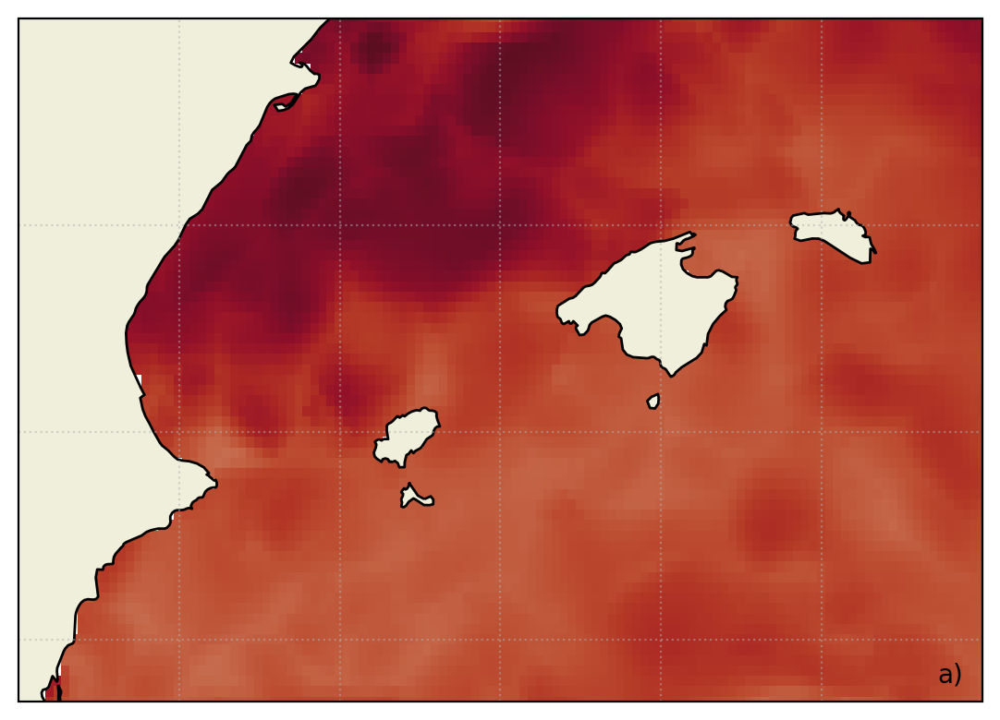

In [ ]:
from pyscripts.basic_plotting import plot_map

da = ds_mhws_rep.intensity_max_max.sel(year=2022)

fig,ax=plot_map(
    da.lon, da.lat,
    da,
    # fig=fig,ax=ax,
    # figsize=(12,20),
    figsize=(12,4),
    fontsize=12,
    figdpi=200,

    # extent=[-5,36,33,45],
    # extent=[-5,14,33,45],
    # extent=[-5,36,30,45],

    add_cbar=False,
    cmap='cmo.amp',
    vmin=1.5, vmax=5.5,
    yticks=4,
    bottom_labels=False,
    left_labels=False,

    show_plots=True,
)

## Figure 4

Making figure of 2400x1080.0px


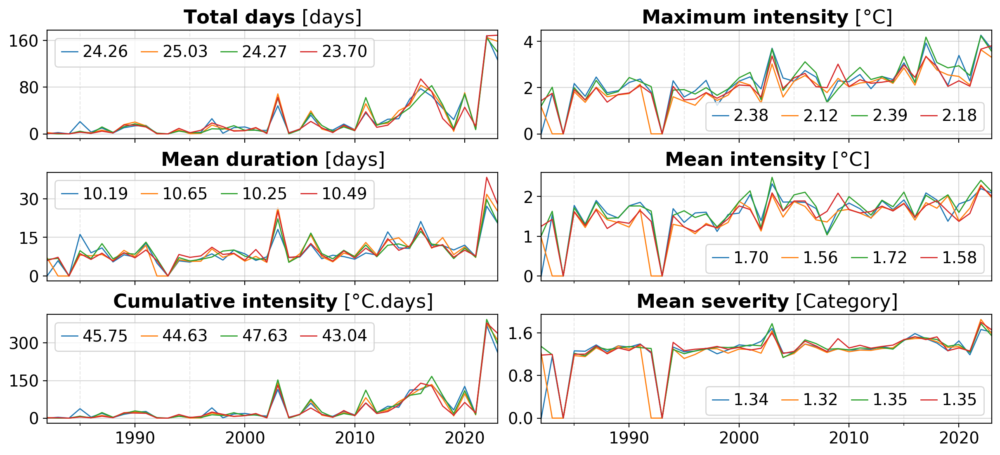

In [13]:
from pyscripts.basic_plotting import plot_timeserie, subplot
from pyscripts.process_data import apply_regional_mask

import math

stats = [
    'total_days',
    'duration',
    'total_icum',
    'intensity_max_max',
    'intensity_mean_byday',
    'severity_mean_byday',
]
regions = [
    "continental_coast",
    "balearic_coast",
    "balearic_sea_deep",
    "west_algerian_deep",
]

ncols = 2
nrows = math.ceil(len(stats) / ncols)


regions_ds = {}

for region in regions:
    regions_ds[region] = apply_regional_mask(ds_mhws_rep, region, ds_bathy_rep)


subplots_settings = []

for id, stat in enumerate(stats):
    col = id // nrows
    row = id % nrows
    # col = id % ncols
    # row = id // ncols

    escaped_name = opts.mhws_stats_shortname[stat].replace(' ', '\ ')

    subplots_settings.append(dict(
        pos = row * ncols + col + 1,
        func = plot_timeserie,
        vars = {
            opts.region_shortname[region]:
                regions_ds[region][stat].mean(dim=["lon","lat"])
            
            for region in regions
        },
        times = regions_ds[regions[0]].year,
        colors = {
            "Continental coast": 'C0',
            "Balearic Islands coast": 'C1',
            "Balearic Sea deep": 'C2',
            "West Algerian Basin deep": 'C3',
        },

        nans_to_zero = True,

        title = fr"$\bf{{{escaped_name}}}$ [{opts.mhws_stats_units[stat]}]",
        legend = {
            'labels': [
                f"{regions_ds[region][stat].mean(dim=['lon','lat']).mean(dim='year'):.2f}"
                for region in regions
            ],
            'ncol': 4,
            'loc': 4 if stat in ['intensity_max_max', 'intensity_mean_byday', 'severity_mean_byday'] else None,
            'handletextpad': 0.3,
            'columnspacing': 0.8,
            'handlelength': 1,
        },

        xticks=(10,),
        xticks_minor=2,

        yticks=3,

        bottom_labels = row == nrows-1
        # ylabel = f"[{opts.mhws_stats_units[stat]}]",
    ))

fig = subplot(
    nrows, ncols,
    subplots_settings,

    # figsize = (12, 4.4),
    figsize = (12, 5.4),
    figdpi = 200,
    fig_fontsize = 14,

    show_plots = True,
)

## Figure 5

Making figure of 2400x2800px


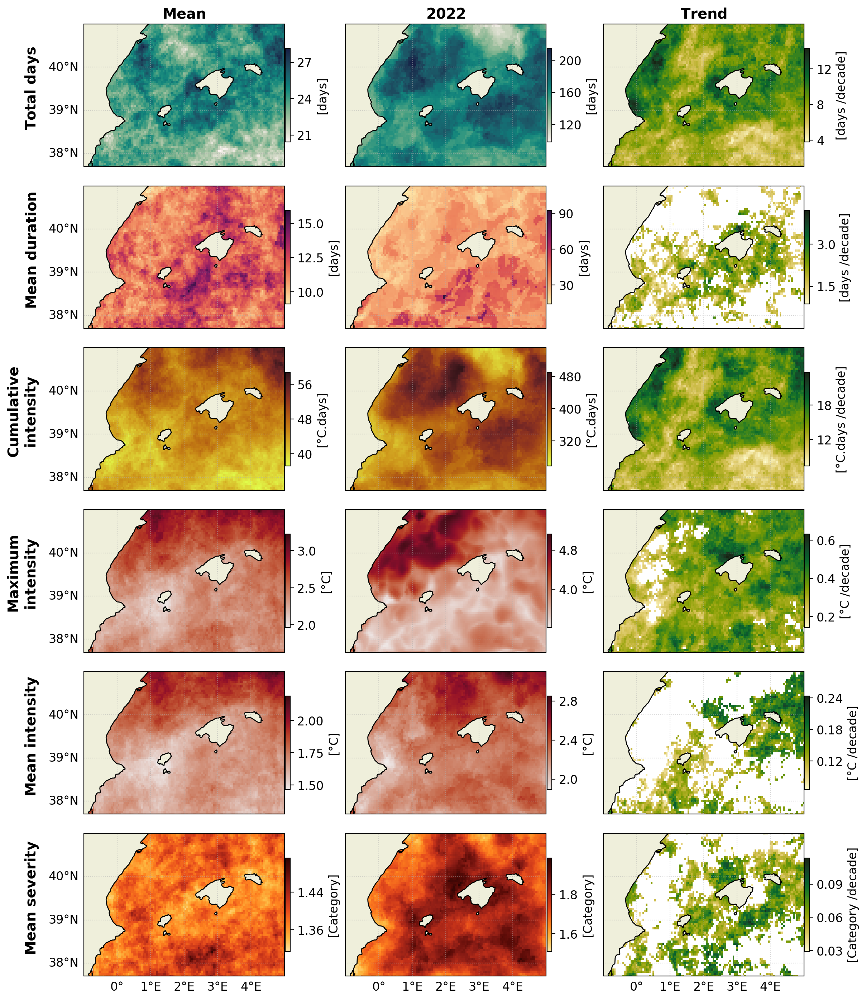

In [10]:
from pyscripts.basic_plotting import plot_map, subplot

columns = ['Mean', '2022', 'Trend']
stats = [
    'total_days',
    'duration',
    'total_icum',
    'intensity_max_max',
    'intensity_mean_byday',
    'severity_mean_byday',
]

vlims = {
    'total_days': (98.00, 215.00),
    'duration': (14.10, 92.50),
    'total_icum': (258.51, 490.28),
    'intensity_max_max': (3.21, 5.13),
    'intensity_mean_byday': (1.89, 2.85),
    'severity_mean_byday': (1.51, 1.98),
}
names = {
    "total_days":           r"$\bf{Total  \ days}$",
    "duration":             r"$\bf{Mean \ duration}$",
    "total_icum":           r"$\bf{Cumulative}$" "\n" r"$\bf{intensity}$",
    "intensity_max_max":    r"$\bf{Maximum}$" "\n" r"$\bf{intensity}$",
    "intensity_mean_byday": r"$\bf{Mean \ intensity}$",
    "severity_mean_byday": r"$\bf{Mean \ severity}$",
}

ncols = len(columns)
nrows = len(stats)

subplots_settings = []

for iss, stat in enumerate(stats):
    for ic, column in enumerate(columns):
        row = iss
        col = ic

        unit = f"[{opts.mhws_stats_units[stat]}]"
        vlim = None
        cmap=opts.mhws_stats_cmaps[stat]

        if column == 'Mean':
            da = ds_mhws_rep[stat].mean(dim='year')
            # vlim = vlims[stat]
        
        elif column == '2022':
            da = ds_mhws_rep[stat].sel(year=2022)
            # print(f"'{stat}': ({da.min():.2f}, {da.max():.2f}),")
        
        elif column == 'Trend':
            # da = ds_mhws_rep[stat].sel(year=2022).where(False)
            da = ds_mhws_rep[stat]

            def apply_mk_test(y):
                if np.isnan(y).all():
                    return np.nan, np.nan, np.nan
                
                trend, h, p, z, tau, s, var_s, slope, intercept = mk.original_test(y, alpha=0.05)
                
                return h, p, slope

            h, p, slope = xr.apply_ufunc(
                apply_mk_test,
                da,
                input_core_dims=[["year"]],
                output_core_dims=[[], [], []],
                vectorize=True,
                dask="parallelized",
                output_dtypes=[bool, float, float],
            )

            # namess = list(opts.region_shortname[i] for i in opts.region_shortname)
            # letters = ['A', 'B', 'C', 'D']
            # lettersbis = ['A+B', 'C+D']
            # print(opts.mhws_stats_shortname[stat])
            # for i, mask in enumerate([continental_coast_mask, balearic_coast_mask, balearic_sea_deep_mask, west_algerian_deep_mask]):
            #     ds = slope.where(mask).mean(dim=['lon','lat'])*10 # Continental coast
            #     # a = ds.sel(year=range(1987,2023)).mean(dim='year')
            #     print(f"{letters[i]}. {namess[i]}: {ds.item():.2f} °C")

            # for i, mask in enumerate([continental_coast_mask | balearic_coast_mask, balearic_sea_deep_mask | west_algerian_deep_mask]):
            #     ds = slope.where(mask).mean(dim=['lon','lat'])*10 # Continental coast
            #     # a = ds.sel(year=range(1987,2023)).mean(dim='year')

            #     print(f"{lettersbis[i]}: {ds.item():.2f} °C")
            # print()

            # vlim = (0,None)
            cmap = 'cmo.speed'

            da = slope.where(h)

            # Change from yearly trend to decadly trend
            da = da * 10

            unit = f"[{opts.mhws_stats_units[stat]} /decade]"

            # y = da.mean(dim=["lon", "lat"])
            # trend, h, p, z, tau, s, var_s, slope, intercept = mk.original_test(y, alpha=0.05)

        # print(da)

        subplots_settings.append(dict(
            pos = iss*ncols + ic + 1,
            func = plot_map,
            lon = da.lon,
            lat = da.lat,
            variable_data = da,
            #  + r"$\bf{" + str(number) + "}$"
            # Parameter of text
            # title = column if row == 0 else None,
            title = r"$\bf{" + column.replace(' ', ' \ ') + "}$" if row == 0 else None,
            # ylabel = names[stat] if col == 0 else None,
            ylabel = names[stat] if col == 0 else None,

            fontsize_title=1.2,
            vlim=vlim,

            cmap=cmap,
            cbar_unit=unit,
            cbar_shrink=0.6,
            
            xticks = 6,
            yticks = 4,
            cbar_ticks=3,

            left_labels = (col == 0),
            bottom_labels = (row == nrows - 1),
        ))

# Creates figure settings, using user settings firstly, otherwise use default
subplot(
    nrows, ncols,
    subplots_settings,
    
    figsize=(12,14),
    fig_fontsize = 12,
    figdpi=200,

    fig_is_a_map = True,

    show_plots = True,
)

## Figure 6 & 7

Making figure of 2400x2400px


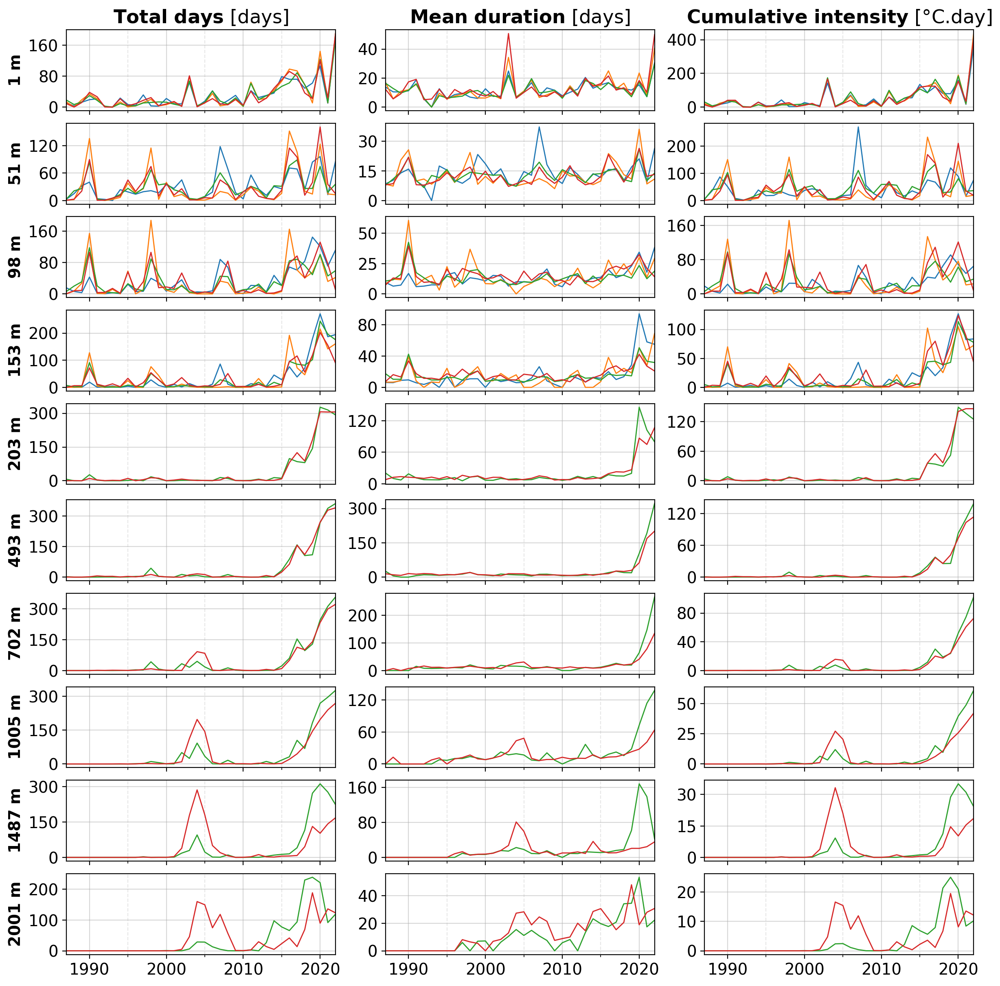

Making figure of 2400x2400px


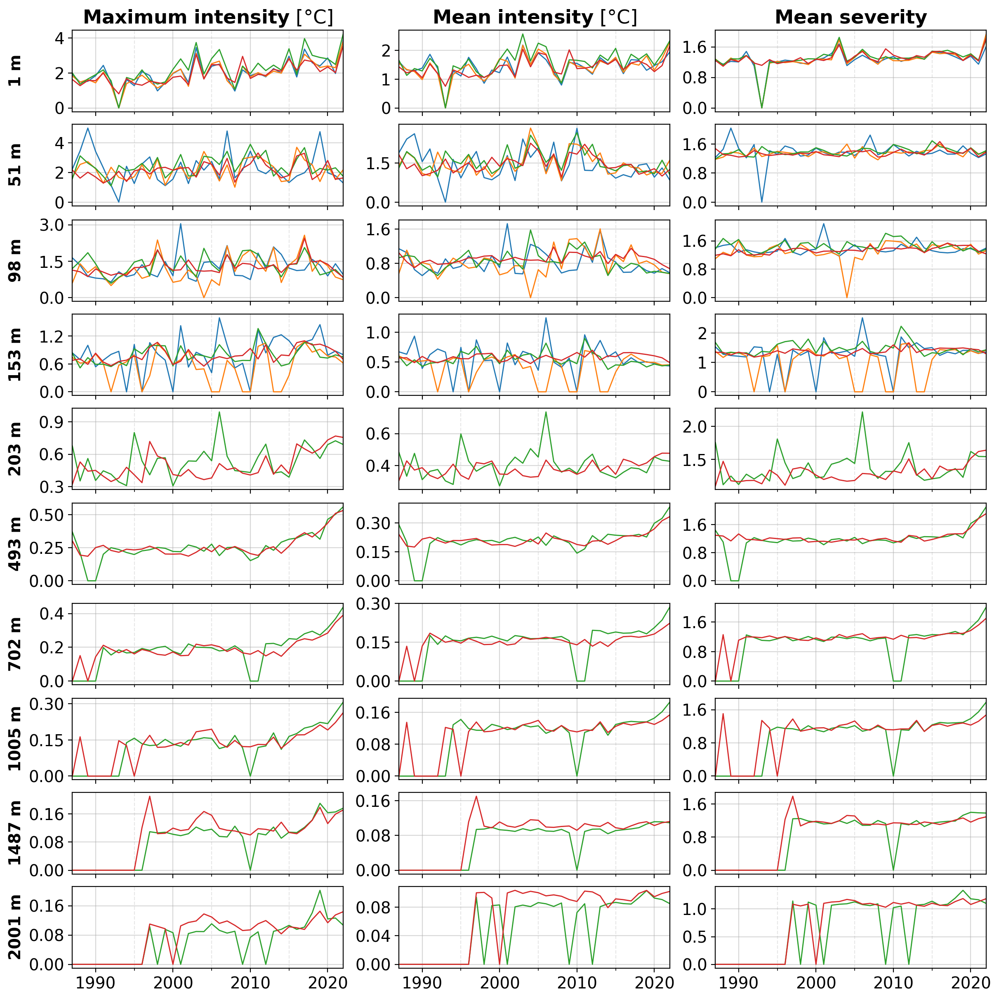

In [14]:
# Generic one

from pyscripts.basic_plotting import plot_timeserie, subplot
from pyscripts.process_data import apply_regional_mask


regions = [
    "continental_coast",
    "balearic_coast",
    "balearic_sea_deep",
    "west_algerian_deep",
]
depths = [0, 50, 100, 150, 200, 500, 700, 1000, 1500, 2000,]

names = {
    "total_days":           r"$\bf{Total  \ days}$ [days]",
    "duration":             r"$\bf{Mean \ duration}$ [days]",
    "total_icum":           r"$\bf{Cumulative \ intensity}$ [°C.day]",
    "intensity_max_max":    r"$\bf{Maximum \ intensity}$ [°C]",
    "intensity_mean_byday": r"$\bf{Mean \ intensity}$ [°C]",
    "severity_mean_byday": r"$\bf{Mean \ severity}$",
}

vlims = {
    'total_days': (0, 366),
    'duration': (0, 300),
    'total_icum': (0, 500),
    'intensity_max_max': (0, 6),
    'intensity_mean_byday': (0, 2.6),
    'severity_mean_byday': (0, 2.6),
}

regions_ds = {}

for region in regions:
    regions_ds[region] = apply_regional_mask(ds_mhws_medrea, region, ds_bathy_medrea)

for i, depth in enumerate(depths):
    depths[i] = ds_mhws_medrea.sel(depth=depth, method='nearest').depth.item()


for stats in [[
    'total_days',
    'duration',
    'total_icum',
],[
    'intensity_max_max',
    'intensity_mean_byday',
    'severity_mean_byday',
]]:
    ncols = len(stats)
    nrows = len(depths)
    
    subplots_settings = []

    for iss, stat in enumerate(stats):
        for id, depth in enumerate(depths):
            col = iss
            row = id

            subplots_settings.append(dict(
                pos = row * ncols + col + 1,
                func = plot_timeserie,
                vars = {
                    opts.region_shortname[region]:
                        regions_ds[region][stat].sel(depth=depth).mean(dim=["lon","lat"], keep_attrs=True)
                    
                    for region in (
                        regions[2:]
                        if (isinstance(depth, float) and depth > 200)
                        else
                            regions
                    )
                },
                times = regions_ds[regions[0]].year,
                colors = {
                    "Continental coast": 'C0',
                    "Balearic Islands coast": 'C1',
                    "Balearic Sea deep": 'C2',
                    "West Algerian Basin deep": 'C3',
                },

                # legend = {
                #     'labels': [
                #         f"{regions_ds[region][stat].sel(depth=depth).mean(dim=['lon','lat']).mean(dim='year'):.2f}"
                #         for region in regions
                #     ],
                #     'ncol': 4,
                #     # 'loc': 4 if stat in ['intensity_max_max', 'intensity_mean_byday', 'severity_mean_byday'] else None,
                #     'handletextpad': 0.3,
                #     'columnspacing': 0.8,
                #     'handlelength': 1,
                # } if depth < 200 else None,

                nans_to_zero=True,

                title = names[stat] if row == 0 else None,
                ylabel = fr"$\bf{{{depth:.0f} \ m}}$" if col == 0 else None,
                legend=False,

                xticks=(10,),
                xticks_minor=2,
                yticks=3,

                # yticks=(3,0),
                # yticks_minor=(1,),
                # ylim=vlims[stat],

                # unit =  if (col == 0) else '',

                # left_labels = (col == 1),
                bottom_labels = (row == nrows-1),
            ))

    fig = subplot(
        nrows, ncols,
        subplots_settings,

        figsize = (12, 12),
        # figsize = (4*ncols,1.28*nrows),
        # figsize = (5*ncols,1.5*nrows),
        figdpi = 200,
        fig_fontsize = 14,

        show_plots = True,
    )

## Figure 8

Making figure of 2400x1200px


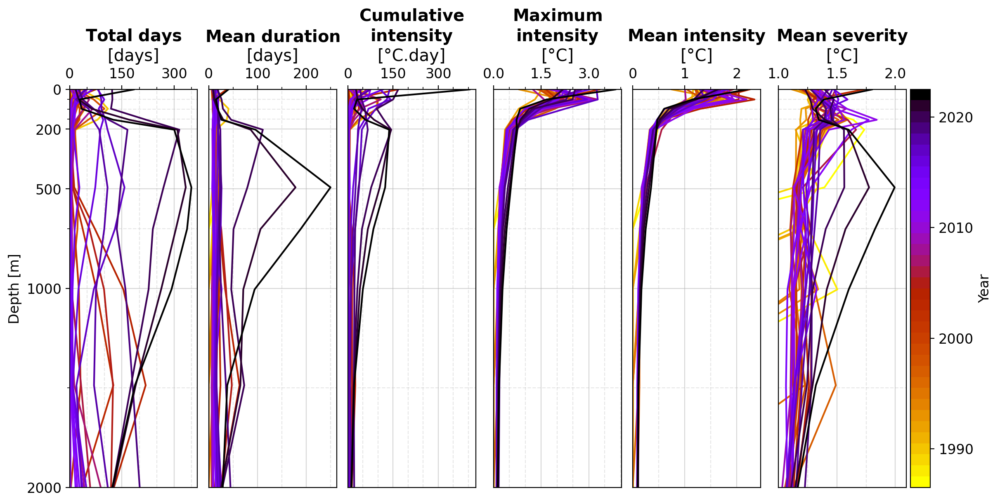

In [12]:
# Generic one

from pyscripts.basic_plotting import plot_vertical_mean, subplot
from matplotlib.colors import ListedColormap

import math

stats = [
    'total_days',
    'duration',
    'total_icum',
    'intensity_max_max',
    'intensity_mean_byday',
    'severity_mean_byday',
]
years = range(1987, 2023)

names = {
    "total_days":           r"$\bf{Total  \ days}$" + "\n[days]",
    "duration":             r"$\bf{Mean \ duration}$" + "\n[days]",
    "total_icum":           r"$\bf{Cumulative}$" "\n" r"$\bf{intensity}$" + "\n[°C.day]",
    "intensity_max_max":    r"$\bf{Maximum}$" "\n" r"$\bf{intensity}$" + "\n[°C]",
    "intensity_mean_byday": r"$\bf{Mean \ intensity}$" + "\n[°C]",
    "severity_mean_byday": r"$\bf{Mean \ severity}$" + "\n[°C]",
}

ncols = 6
nrows = math.ceil(len(stats) / ncols)

xticks = [3, 3, 3, 3, 3, (.5,)]
xticks_minors = [3, 2, 3, 3, 2, 2]

subplots_settings = []

cmap = 'gnuplot_r'
base_cmap = plt.get_cmap(cmap)

# Extract the 20 original colors
base_colors = base_cmap(np.linspace(0, 1, 36))

# # Repeat the palette with slight variations to get 36 colors
# # You can use HSL manipulation or just cycle with small brightness tweaks
# def generate_36_colors(base_colors):
#     new_colors = []
#     n_repeats = int(np.ceil(36 / len(base_colors)))
#     for i in range(n_repeats):
#         for c in base_colors:
#             # Slightly vary brightness each cycle (optional)
#             factor = 1 - (i * 0.1)
#             c_mod = tuple(np.clip(c[:3] * factor, 0, 1)) + (1.0,)  # Keep alpha = 1
#             new_colors.append(c_mod)
#             if len(new_colors) == 36:
#                 return new_colors
#     return new_colors

# colors_36 = generate_36_colors(base_colors)
cmap = ListedColormap(base_colors)

for id, stat in enumerate(stats):
    col = id % ncols
    row = id // ncols

    # cmaps = plt.get_cmap(opts.mhws_stats_cmaps[stat])
    cmaps = plt.get_cmap(cmap)
    colors = cmaps(np.linspace(0, 1, len(years)))

    vars = {}
    for year in years:
        if stat in ['total_icum', 'total_scum', 'total_days']:
            vars[year] = ds_mhws_medrea[stat].sel(year=year).mean(dim=["lat", "lon"], skipna=True)

        else:
            ds = ds_mhws_medrea[stat].where(ds_mhws_medrea[stat] != 0., np.nan)
            ds = ds.sel(year=year).mean(dim=["lat", "lon"], skipna=True)
            vars[year] = ds.where(ds != 0.)
            # vars[year] = ds.where(False)

    subplots_settings.append(dict(
        pos = row * ncols + col + 1,
        func = plot_vertical_mean,
        vars=vars,
        depths = ds_mhws_medrea.depth,
        colors = {
            year: color
            for year, color in zip(years, colors)
        },

        nans_to_zero=True,

        title = names[stat],
        # unit = opts.mhws_stats_units[stat],

        xlim = (1,None) if stat in ['severity_mean_byday'] else (0, None),
        ylim = (0,2000),

        yticks=[0,200,500,1000,2000],
        yticks_minor=[50,100,150,700,1500],
        xticks=xticks[id],
        xticks_minor=xticks_minors[id],

        left_labels = (col == 0),
        top_labels = True,
        bottom_labels = False,
    ))

fig = subplot(
    nrows, ncols,
    subplots_settings,
    # pad_subplots=(0.1, 0.1),

    figsize = (12, 6),
    figdpi = 200,
    fig_fontsize = 12,

    fig_cbar=True,
    fig_cmap=cmap,
    fig_vmin=1986.5,
    fig_vmax=2022.5,
    fig_cbar_fraction=0.04,
    fig_cbar_unit='Year',
    fig_cbar_ticks=(10.,),

    show_plots = True,
)

In [13]:
# Extra for part 4.
ds_mhws_rep.sel(year=[2003,2022]).mean(dim=['lon','lat'])[stats]

<xarray.Dataset> Size: 112B
Dimensions:               (year: 2)
Coordinates:
  * year                  (year) int64 16B 2003 2022
Data variables:
    total_days            (year) float64 16B 60.63 165.4
    duration              (year) float64 16B 23.33 33.47
    total_icum            (year) float64 16B 137.1 381.4
    intensity_max_max     (year) float64 16B 3.507 3.928
    intensity_mean_byday  (year) float64 16B 2.253 2.31
    severity_mean_byday   (year) float64 16B 1.665 1.772

In [14]:
# Extra for part 4.
from pyscripts.process_data import apply_regional_mask

da_regions = xr.full_like(ds_mhws_rep.isel(year=0).total_days, np.nan)

continental_coast_mask = apply_regional_mask(da_regions, 'continental_coast', ds_bathy_rep, return_mask=True)
balearic_coast_mask = apply_regional_mask(da_regions, 'balearic_coast', ds_bathy_rep, return_mask=True)
balearic_sea_deep_mask = apply_regional_mask(da_regions, 'balearic_sea_deep', ds_bathy_rep, return_mask=True)
west_algerian_deep_mask = apply_regional_mask(da_regions, 'west_algerian_deep', ds_bathy_rep, return_mask=True)

names = list(opts.region_shortname[i] for i in opts.region_shortname)
letters = ['A', 'B', 'C', 'D']
lettersbis = ['A+C', 'B+D']
for stat in ['intensity_max_max', 'intensity_mean_byday']:
    print(opts.mhws_stats_shortname[stat])
    for i, mask in enumerate([continental_coast_mask, balearic_coast_mask, balearic_sea_deep_mask, west_algerian_deep_mask]):
        ds = ds_mhws_rep[stat].where(mask).mean(dim=['lon','lat']) # Continental coast
        a = ds.sel(year=range(1987,2023)).mean(dim='year')
        print(f"{letters[i]}. {names[i]}: {a.item():.2f} °C")

    for i, mask in enumerate([continental_coast_mask | balearic_sea_deep_mask | balearic_coast_mask | west_algerian_deep_mask]):
        ds = ds_mhws_rep[stat].where(mask).mean(dim=['lon','lat']) # Continental coast
        a = ds.sel(year=range(1987,2023)).mean(dim='year')

        print(f"{lettersbis[i]}: {a.item():.2f} °C")
    print()

Maximum intensity
A. Continental coast: 2.38 °C
B. Balearic Islands coast: 2.14 °C
C. Balearic Sea deep: 2.43 °C
D. West Algerian Basin deep: 2.20 °C
A+C: 2.31 °C

Mean intensity
A. Continental coast: 1.70 °C
B. Balearic Islands coast: 1.57 °C
C. Balearic Sea deep: 1.75 °C
D. West Algerian Basin deep: 1.59 °C
A+C: 1.66 °C



## Figure 9

19.85
Making figure of 2400x3040.0px


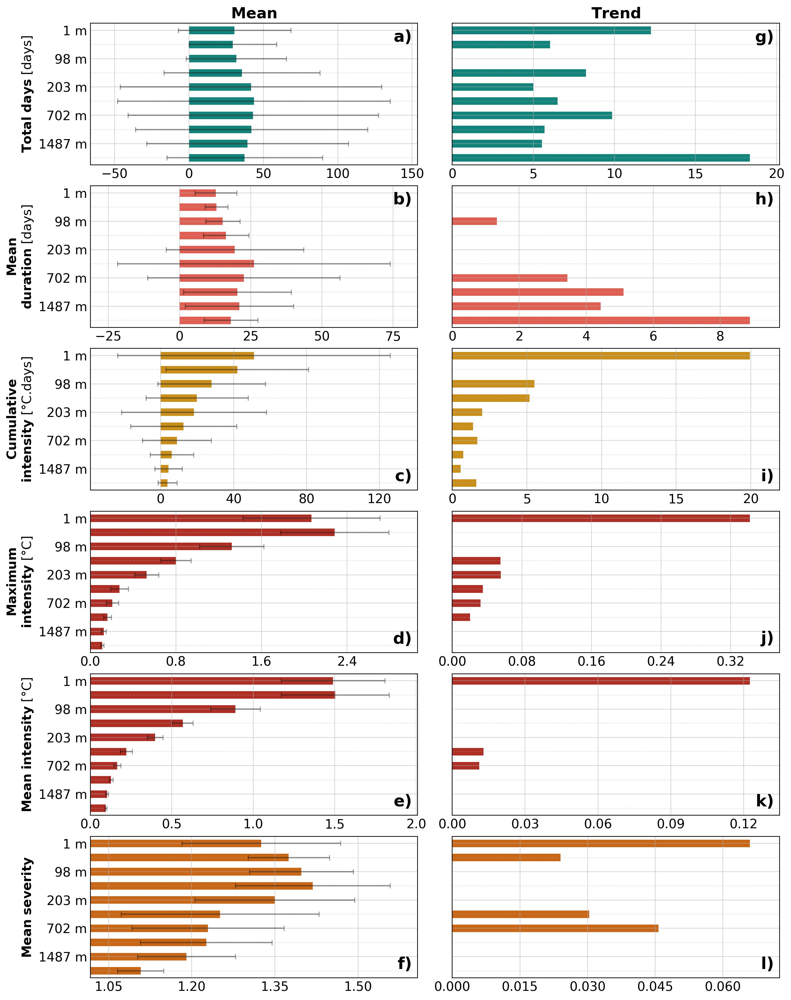

In [29]:
from pyscripts.basic_plotting import plot_bars, subplot
from pyscripts.process_data import apply_regional_mask

# USER INPUT - Choose what to be displayed
columns = [
    'Mean',
    # '2022',
    'Trend'
]
stats = [
    'total_days',
    'duration',
    'total_icum',
    # 'intensity_max_max',
    # 'intensity_mean_byday',
    # 'severity_mean_byday',
]
# regions = [
#     "continental_coast",
#     "balearic_coast",
#     "balearic_sea_deep",
#     "west_algerian_deep",
# ]

# Names of stat with bolding
names = {
    "total_days":           r"$\bf{Total  \ days}$ [days]",
    "duration":             r"$\bf{Mean}$" "\n" r"$\bf{duration}$ [days]",
    "total_icum":           r"$\bf{Cumulative}$" "\n" r"$\bf{intensity}$ [°C.days]",
    "intensity_max_max":    r"$\bf{Maximum}$" "\n" r"$\bf{intensity}$ [°C]",
    "intensity_mean_byday": r"$\bf{Mean \ intensity}$ [°C]",
    "severity_mean_byday": r"$\bf{Mean \ severity}$",
}

subplot_label = ["a)", "b)", "c)", "d)", "e)", "f)", "g)", "h)", "i)", "j)", "k)", "l)"]

# ds = ds_mhws_rep.expand_dims({'depth': [0]})

# regions_ds = {}

# for region in regions:
#     regions_ds[region] = apply_regional_mask(ds_mhws_medrea, region, ds_bathy_medrea)
    # regions_ds[region] = apply_regional_mask(ds, region, ds_bathy_rep)


# Subplot loop
for stats in [
    [
        'total_days',
        'duration',
        'total_icum',
    # ], [
        'intensity_max_max',
        'intensity_mean_byday',
        'severity_mean_byday',
    ]
]:
    subplots_settings = []

    ncols = len(columns)
    nrows = len(stats)

    for row, stat in enumerate(stats):
        for col, column in enumerate(columns):
            ds = ds_mhws_medrea

            std, hatchs = None, None

            if column == 'Mean':
                da = ds[stat].mean(dim=['lon', 'lat']).mean(dim='year')
                std = ds[stat].mean(dim=['lon', 'lat']).std(dim='year')

                if row == 2:
                    print(f"{da.sel(depth=153, method='nearest'):.2f}")
            
            elif column == '2022':
                da = ds[stat].sel(year=2022).mean(dim=['lon', 'lat'])
                # print(f"'{stat}': ({da.min():.2f}, {da.max():.2f}),")
            
            elif column == 'Trend':
                da = ds[stat].mean(dim=['lon', 'lat'])

                def apply_mk_test(y):
                    if np.isnan(y).all():
                        return np.nan, np.nan, np.nan
                    
                    trend, h, p, z, tau, s, var_s, slope, intercept = mk.original_test(y, alpha=0.05)
                    
                    return h, p, slope

                h, p, slope = xr.apply_ufunc(
                    apply_mk_test,
                    da,
                    input_core_dims=[["year"]],
                    output_core_dims=[[], [], []],
                    vectorize=True,
                    dask="parallelized",
                    output_dtypes=[bool, float, float],
                )


                da = slope.where(h, 0)
                # da = slope
                # hatchs = {
                #     # depth: None if h.sel(depth=depth).item() else 'xx'
                #     depth: None if h.sel(depth=depth).item() else '/////'
                #     for depth in da.depth.values
                # }
                # print(f"{opts.mhws_stats_shortname[stat]} trend: {slope.where(h).min()*10:.2f}, {slope.where(h).max()*10:.2f}")

                # Change from yearly trend to decadly trend
                da = da * 10

                unit = f"[{opts.mhws_stats_units[stat]} /decade]"
            
            colors = {
                "total_days":           "#13847b",
                "duration":             "#e15f52",
                "total_icum":           "#ca8f18",
                "intensity_max_max":    "#af2f24",
                'intensity_mean_byday': "#af2f24",
                'severity_mean_byday':  "#c96716",

            }

            subplots_settings.append(dict(
                pos = row*ncols + col + 1,
                func = plot_bars,
                depths = da.depth.values,
                vars = {'a': da},
                stds = {'a': std} if column == 'Mean' else None,
                # colors = '#777',
                colors = colors[stat],

                title = utils.bold(column) if row == 0 else None,
                ylabel = names[stat] if col == 0 else None,

                bars_pad = 0.5,
                # hatch = {'a': hatchs} if column == 'Trend' else None,

                xticks = 5,
                yticks = 2,

                left_labels = (col == 0),
                # bottom_labels = (row == nrows - 1),

                texts = [dict(
                    x=0.98,
                    y=(0.04-0.96) * [0,0,1,1,1,1,0,0,1,1,1,1][row + nrows*col] + 0.96,
                    s=utils.bold(subplot_label[row + nrows*col]),
                    ha='right',
                    va='bottom' if [0,0,1,1,1,1,0,0,1,1,1,1][row + nrows*col] else 'top',
                    fontsize=18
                )]
            ))

    # Creates figure settings, using user settings firstly, otherwise use default
    subplot(
        nrows, ncols,
        subplots_settings,
        
        figsize=(12,15.2),
        fig_fontsize = 14,
        figdpi=200,

        show_plots = True,
    )

/home/arthur/.local/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/arthur/.local/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/arthur/.local/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/arthur/.local/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/arthur/.local/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/arthur/.local/lib/python

Making figure of 2400x2400px


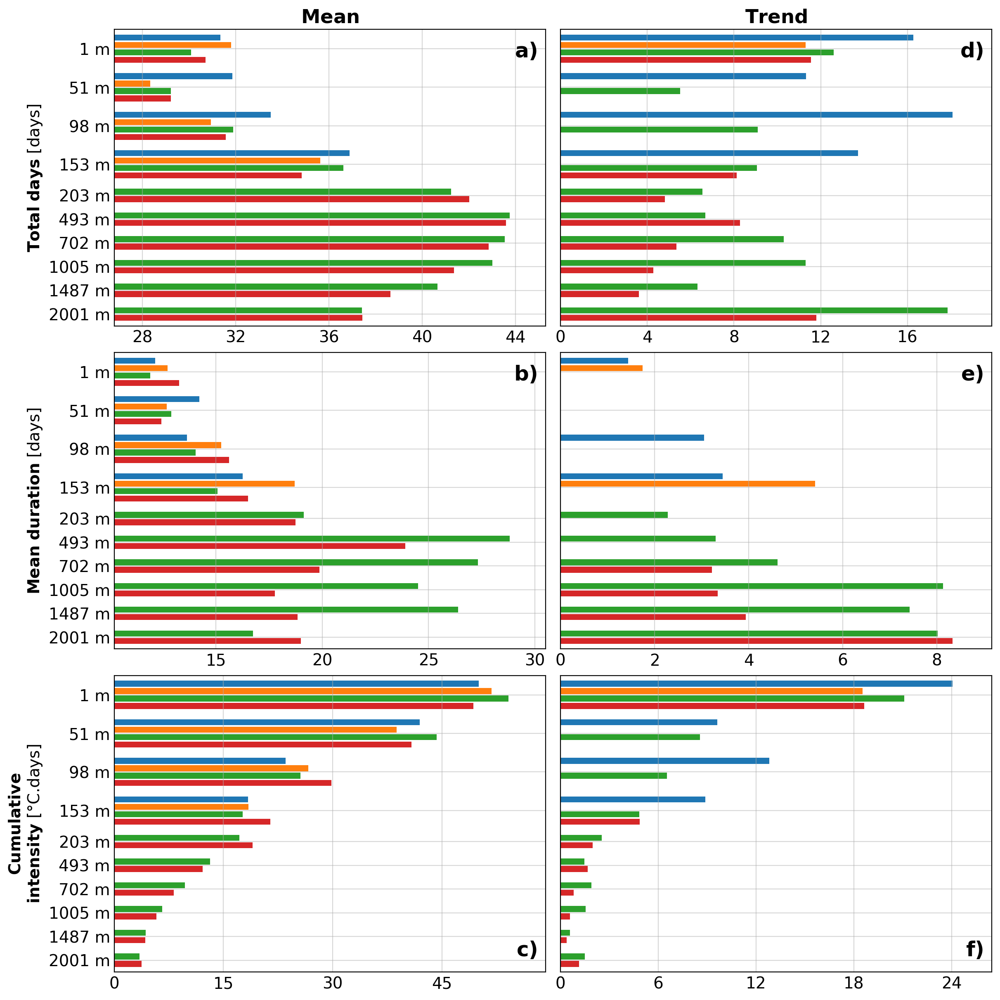

/home/arthur/.local/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/arthur/.local/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/arthur/.local/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/arthur/.local/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/arthur/.local/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/arthur/.local/lib/python

Making figure of 2400x2400px


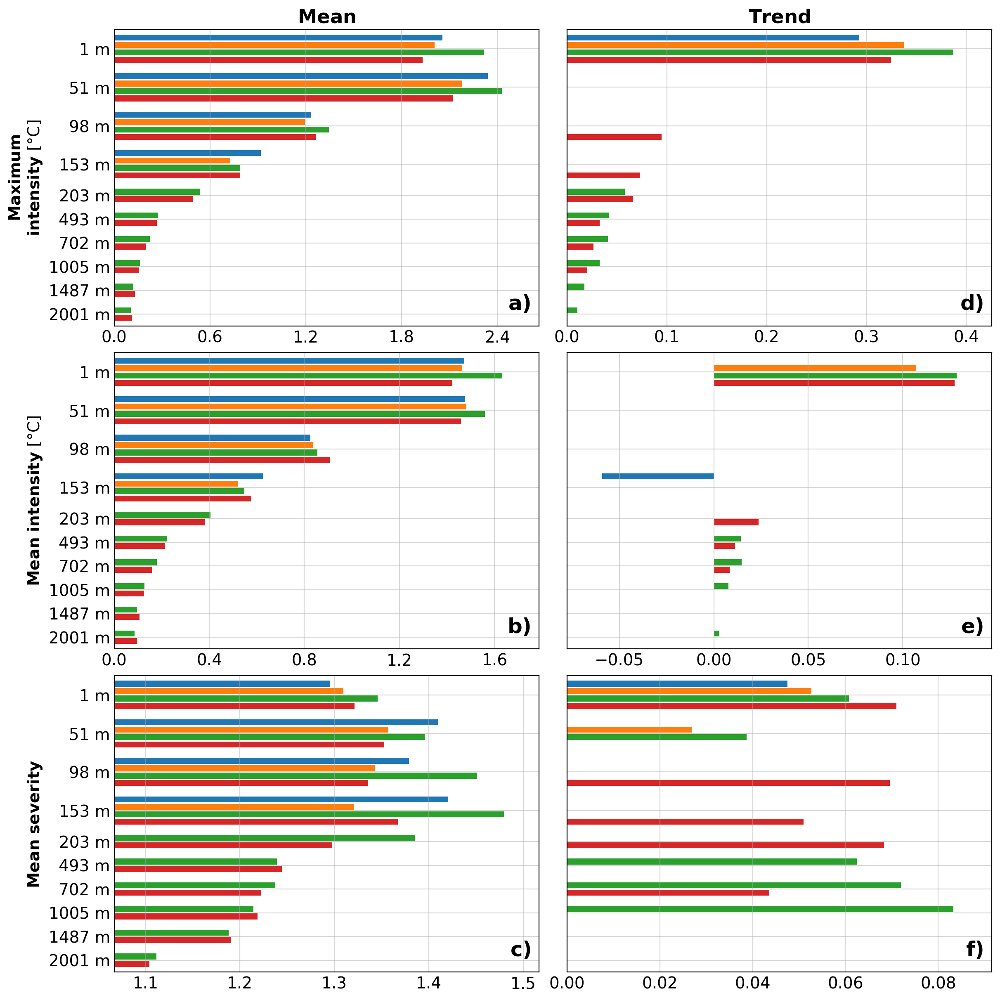

In [31]:
from pyscripts.basic_plotting import plot_bars, subplot
from pyscripts.process_data import apply_regional_mask

# USER INPUT - Choose what to be displayed
columns = [
    'Mean',
    # '2022',
    'Trend'
]
stats = [
    'total_days',
    'duration',
    'total_icum',
    # 'intensity_max_max',
    # 'intensity_mean_byday',
    # 'severity_mean_byday',
]
regions = [
    "continental_coast",
    "balearic_coast",
    "balearic_sea_deep",
    "west_algerian_deep",
]

# Names of stat with bolding
names = {
    "total_days":           r"$\bf{Total  \ days}$ [days]",
    "duration":             r"$\bf{Mean \ duration}$ [days]",
    "total_icum":           r"$\bf{Cumulative}$" "\n" r"$\bf{intensity}$ [°C.days]",
    "intensity_max_max":    r"$\bf{Maximum}$" "\n" r"$\bf{intensity}$ [°C]",
    "intensity_mean_byday": r"$\bf{Mean \ intensity}$ [°C]",
    "severity_mean_byday":  r"$\bf{Mean \ severity}$",
}

subplot_label = ["a)", "b)", "c)", "d)", "e)", "f)", "g)", "h)", "i)", "j)", "k)", "l)"]
subplot_label_pos = {
    "total_days":           [1, 1],
    "duration":             [1, 1],
    "total_icum":           [0, 0],
    "intensity_max_max":    [0, 0],
    "intensity_mean_byday": [0, 0],
    "severity_mean_byday":  [0, 0],
}

# ds = ds_mhws_rep.expand_dims({'depth': [0]})

regions_ds = {}

for region in regions:
    regions_ds[region] = apply_regional_mask(ds_mhws_medrea, region, ds_bathy_medrea)
    # regions_ds[region] = apply_regional_mask(ds, region, ds_bathy_rep)


# Subplot loop
for stats in [
    [
        'total_days',
        'duration',
        'total_icum',
    ], [
        'intensity_max_max',
        'intensity_mean_byday',
        'severity_mean_byday',
    ]
]:
    subplots_settings = []

    ncols = len(columns)
    nrows = len(stats)

    for row, stat in enumerate(stats):
        for col, column in enumerate(columns):
            region_das = {}
            region_das_std = {}
            region_hatchs = {}

            for region in regions:
                ds = regions_ds[region]

                if column == 'Mean':
                    da = ds[stat].mean(dim=['lon', 'lat']).mean(dim='year')
                    std = ds[stat].mean(dim=['lon', 'lat']).std(dim='year')

                    region_das_std[region] = std
                
                elif column == '2022':
                    da = ds[stat].sel(year=2022).mean(dim=['lon', 'lat'])
                    # print(f"'{stat}': ({da.min():.2f}, {da.max():.2f}),")
                
                elif column == 'Trend':
                    da = ds[stat].mean(dim=['lon', 'lat'])

                    def apply_mk_test(y):
                        if np.isnan(y).all():
                            return np.nan, np.nan, np.nan
                        
                        trend, h, p, z, tau, s, var_s, slope, intercept = mk.original_test(y, alpha=0.05)
                        
                        return h, p, slope

                    h, p, slope = xr.apply_ufunc(
                        apply_mk_test,
                        da,
                        input_core_dims=[["year"]],
                        output_core_dims=[[], [], []],
                        vectorize=True,
                        dask="parallelized",
                        output_dtypes=[bool, float, float],
                    )

                    da = slope.where(h, 0)
                    # da = slope
                    # hatchs = {
                    #     depth: None if h.sel(depth=depth).item() else '////'
                    #     for depth in da.depth.values
                    # }
                    # region_hatchs[region] = hatchs

                    # Change from yearly trend to decadly trend
                    da = da * 10

                    unit = f"[{opts.mhws_stats_units[stat]} /decade]"
                
                region_das[region] = da


            subplots_settings.append(dict(
                pos = row*ncols + col + 1,
                func = plot_bars,
                depths = da.depth.values,
                vars = region_das,
                # stds = region_das_std if column == 'Mean' else None,

                title = utils.bold(column) if row == 0 else None,
                ylabel = names[stat] if col == 0 else None,

                # hatch = region_hatchs if column == 'Trend' else None,

                bars_pad = 1.2,
                
                xticks = 5,
                # yticks = 2,

                left_labels = (col == 0),
                # bottom_labels = (row == nrows - 1),

                texts = [dict(
                    x=0.98,
                    y=(0.96-0.04) * subplot_label_pos[stat][col] + 0.04,
                    s=utils.bold(subplot_label[row + nrows*col]),
                    ha='right',
                    va='top' if subplot_label_pos[stat][col] else 'bottom',
                    fontsize=18
                )]
            ))

    # Creates figure settings, using user settings firstly, otherwise use default
    subplot(
        nrows, ncols,
        subplots_settings,
        
        figsize=(12,12),
        fig_fontsize = 14,
        figdpi=200,

        show_plots = True,
    )

## Figure 10

In [20]:
from pyscripts.load_save_dataset import load_mhws_dataset

ds_mhws_rep_mean = load_mhws_dataset(
    ds_type = 'all_events',
    dataset_used = 'medrea_mean',
    detrended = False,
    region = 'balears',
    clim_period = clim_period
)

Loaded MHWs dataset.


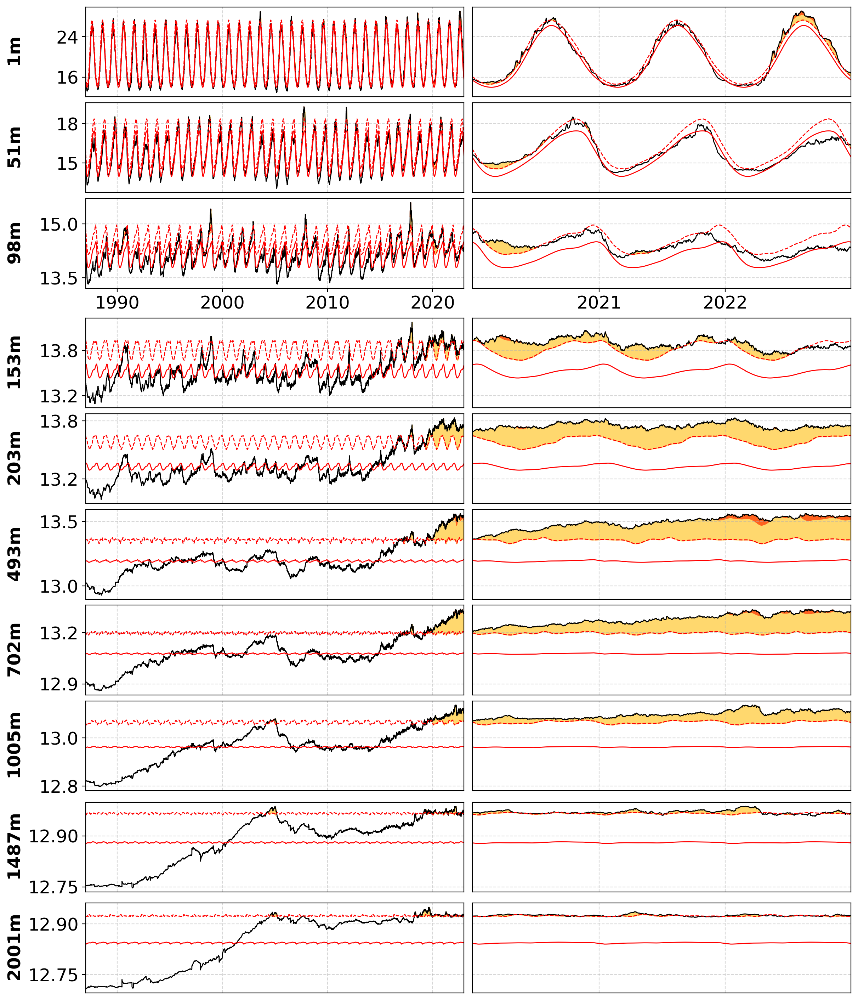

In [21]:
from pyscripts.mhw_computer import get_mhw_ts_from_ds
from pyscripts.basic_plotting import get_locator_from_ticks
import matplotlib.pyplot as plt
import numpy as np

from datetime import date
from matplotlib.lines import Line2D
from matplotlib.patches import Patch


depths = [1, 98, 493, 1005]
depths = ds_mhws_rep_mean.depth
date_ranges = [(0.5, 39.31), (0.5, 39.31)]

with plt.rc_context({'font.size': 18}):
    fig = plt.figure(figsize=(12, 14), dpi=200, constrained_layout=True)

    n_rows = len(depths)
    n_cols = len(date_ranges)

    for col, (t0, t1) in enumerate(date_ranges):
        for row, depth in enumerate(depths):
            time, mhws = get_mhw_ts_from_ds(ds_mhws_rep_mean, None, None, depth)

            if mhws == -1:
                continue

            ax = fig.add_subplot(n_rows, n_cols, row*n_cols + col + 1)

            ax.plot(time, mhws["clim_sst"], label="thetao", c='k', lw=1)
            ax.plot(time, mhws["clim_thresh"], label="1987-2021 p90", c='r', ls='--', lw=1)
            ax.plot(time, mhws["clim_seas"], label="1987-2021 mean", c='r', lw=1)

            mhws["clim_2thresh"] = mhws["clim_thresh"]*2 - mhws["clim_seas"]
            mhws["clim_3thresh"] = mhws["clim_thresh"]*3 - mhws["clim_seas"]*2

            for ev in range(mhws["n_events"]):
                id_slice = slice(mhws["index_start"][ev], mhws["index_end"][ev]+1)

                ax.fill_between(
                    time[id_slice],
                    mhws["clim_thresh"][id_slice],
                    np.minimum(
                        mhws["clim_sst"][id_slice],
                        mhws["clim_2thresh"][id_slice],
                    ),
                    color='#ffd86e',
                )
                
                strong_intensity = mhws["clim_sst"][id_slice]
                strong_intensity[np.where(mhws["clim_sst"][id_slice] < mhws["clim_2thresh"][id_slice])] = np.nan

                ax.fill_between(
                    time[id_slice],
                    mhws["clim_2thresh"][id_slice],
                    np.minimum(
                        strong_intensity,
                        mhws["clim_3thresh"][id_slice],
                    ),
                    color='#ff621f',
                )
                
                severe_intensity = mhws["clim_sst"][id_slice]
                severe_intensity[np.where(mhws["clim_sst"][id_slice] < mhws["clim_3thresh"][id_slice])] = np.nan

                ax.fill_between(
                    time[id_slice],
                    mhws["clim_3thresh"][id_slice],
                    severe_intensity,
                    color='#df391b',
                )

            ax.grid(True, ls='--', alpha=0.5)
            
            ax.yaxis.set_major_locator(get_locator_from_ticks(1))

            if col == 0:
                # ax.set_title(f"{depth:.0f}m", fontsize='medium')
                # ax.set_ylabel(fr"$\bf{{{depth:.0f}m}}$" "\n[°C]")
                ax.set_ylabel(fr"$\bf{{{depth:.0f}m}}$")
            else:
                # ax.set_yticks([])
                ax.tick_params(which='both', left=False, labelleft=False)
            
            fig.align_ylabels()

            if col == 1:
                ax.set_xlim(date(2020, 1, 1), date(2022, 12, 31))
                ax.set_xticks(
                    [date(2021, 1, 1), date(2022, 1, 1)],
                    ["2021", "2022"]
                )

            else:
                ax.set_xlim(date(1987, 1, 1), date(2022, 12, 31))
                ax.set_xticks(
                    [date(1990, 1, 1), date(2000, 1, 1), date(2010, 1, 1), date(2020, 1, 1)],
                    ["1990", "2000", "2010", "2020"]
                )

            if not row == nrows-1:
                ax.tick_params(which='both', bottom=False, labelbottom=False)

            # ax.set_title(f"{depth:.0f}m", fontsize='medium')
            ax.get_legend_handles_labels()

plt.show()

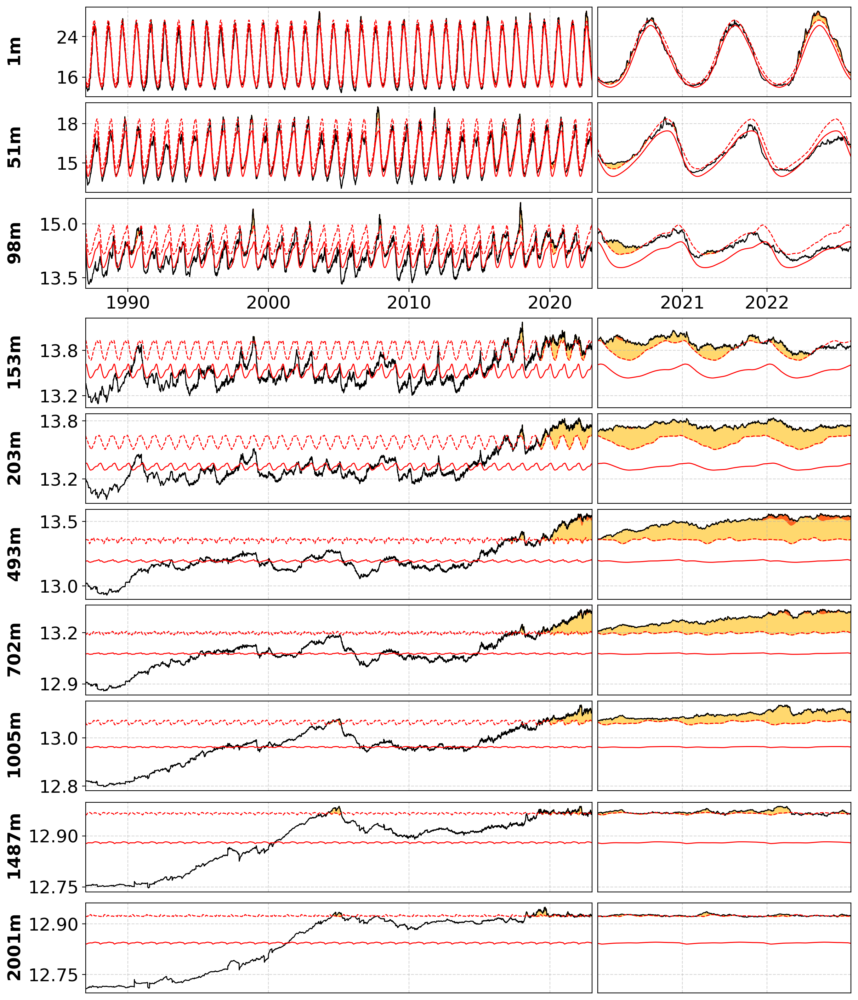

In [22]:
from pyscripts.mhw_computer import get_mhw_ts_from_ds
from pyscripts.basic_plotting import get_locator_from_ticks
import matplotlib.pyplot as plt
import numpy as np

from datetime import date
from matplotlib.lines import Line2D
from matplotlib.patches import Patch


depths = [1, 98, 493, 1005]
depths = ds_mhws_rep_mean.depth
date_ranges = [(0.5, 39.31), (0.5, 39.31)]

with plt.rc_context({'font.size': 18}):
    fig = plt.figure(figsize=(12, 14), dpi=200, constrained_layout=True)

    n_rows = len(depths)
    n_cols = len(date_ranges)+1

    for col, (t0, t1) in enumerate(date_ranges):
        for row, depth in enumerate(depths):
            time, mhws = get_mhw_ts_from_ds(ds_mhws_rep_mean, None, None, depth)

            if mhws == -1:
                continue

            index = (row*n_cols + 1, row*n_cols + 2) if col == 0 else row*n_cols + col + 2

            ax = fig.add_subplot(n_rows, n_cols, index)

            ax.plot(time, mhws["clim_sst"], label="thetao", c='k', lw=1)
            ax.plot(time, mhws["clim_thresh"], label="1987-2021 p90", c='r', ls='--', lw=1)
            ax.plot(time, mhws["clim_seas"], label="1987-2021 mean", c='r', lw=1)

            mhws["clim_2thresh"] = mhws["clim_thresh"]*2 - mhws["clim_seas"]
            mhws["clim_3thresh"] = mhws["clim_thresh"]*3 - mhws["clim_seas"]*2

            for ev in range(mhws["n_events"]):
                id_slice = slice(mhws["index_start"][ev], mhws["index_end"][ev]+1)

                ax.fill_between(
                    time[id_slice],
                    mhws["clim_thresh"][id_slice],
                    np.minimum(
                        mhws["clim_sst"][id_slice],
                        mhws["clim_2thresh"][id_slice],
                    ),
                    color='#ffd86e',
                )
                
                strong_intensity = mhws["clim_sst"][id_slice]
                strong_intensity[np.where(mhws["clim_sst"][id_slice] < mhws["clim_2thresh"][id_slice])] = np.nan

                ax.fill_between(
                    time[id_slice],
                    mhws["clim_2thresh"][id_slice],
                    np.minimum(
                        strong_intensity,
                        mhws["clim_3thresh"][id_slice],
                    ),
                    color='#ff621f',
                )
                
                severe_intensity = mhws["clim_sst"][id_slice]
                severe_intensity[np.where(mhws["clim_sst"][id_slice] < mhws["clim_3thresh"][id_slice])] = np.nan

                ax.fill_between(
                    time[id_slice],
                    mhws["clim_3thresh"][id_slice],
                    severe_intensity,
                    color='#df391b',
                )

            ax.grid(True, ls='--', alpha=0.5)
            
            ax.yaxis.set_major_locator(get_locator_from_ticks(1))

            if col == 0:
                # ax.set_title(f"{depth:.0f}m", fontsize='medium')
                # ax.set_ylabel(fr"$\bf{{{depth:.0f}m}}$" "\n[°C]")
                ax.set_ylabel(fr"$\bf{{{depth:.0f}m}}$")
            else:
                # ax.set_yticks([])
                ax.tick_params(which='both', left=False, labelleft=False)
            
            fig.align_ylabels()

            if col == 1:
                ax.set_xlim(date(2020, 1, 1), date(2022, 12, 31))
                ax.set_xticks(
                    [date(2021, 1, 1), date(2022, 1, 1)],
                    ["2021", "2022"]
                )

            else:
                ax.set_xlim(date(1987, 1, 1), date(2022, 12, 31))
                ax.set_xticks(
                    [date(1990, 1, 1), date(2000, 1, 1), date(2010, 1, 1), date(2020, 1, 1)],
                    ["1990", "2000", "2010", "2020"]
                )

            if not row == nrows-1:
                ax.tick_params(which='both', bottom=False, labelbottom=False)

            # ax.set_title(f"{depth:.0f}m", fontsize='medium')
            ax.get_legend_handles_labels()

plt.show()

## Table 1

In [23]:
for i, stat in enumerate([
    'total_days',
    'duration',
    'total_icum',
    'intensity_max_max',
    'intensity_mean_byday',
    'severity_mean_byday',
]):
    print(f"{i+1}. {opts.mhws_stats_shortname[stat]}")

    for model in ["REP82", "REP", "MEDREA"]:
        if model == "REP82":
            da = ds_mhws_rep[stat].sel(year=slice(1982,2023))
        elif model == "REP":
            da = ds_mhws_rep[stat].sel(year=slice(1987,2022))
        elif model == "MEDREA":
            da = ds_mhws_medrea[stat].sel(depth=0, method='nearest')

        y = da.mean(dim=["lon", "lat"])

        mean = y.mean(dim='year')
        std = y.std(dim='year')

        trend, h, p, z, tau, s, var_s, slope, intercept = mk.original_test(y, alpha=0.05)

        # plt.figure()

        # plt.plot(y, c='k')
        # plt.plot(slope*np.arange(y.size)+intercept, ls='--', c='r')
        # plt.title('mk')

        # plt.figure()

        # a = da.mean(dim=['lon', 'lat']).polyfit(dim='year', deg=1, skipna=True).polyfit_coefficients

        # print(a)

        # plt.plot(y, c='k')
        # plt.plot(a.sel(degree=1, drop=True).item() * np.arange(1987, 2023) + a.sel(degree=0, drop=True).item(), ls='--', c='r')
        # plt.title('polyfit')

        # print(da.mean(dim=['lon', 'lat']).polyfit(dim='year', deg=1, skipna=True).polyfit_coefficients.sel(degree=1, drop=True).item())
        

        print(f"{model} mean : {mean:.2f} ± {std:.2f} {opts.mhws_stats_units[stat]}")

        if h:
            print(f"{model} trend : {slope*10:.2f} {opts.mhws_stats_units[stat]} /decade (p-value={p:.5f})")
        
        else:
            print(f"No significant trend for {model}.")

    
    print()

1. Total days
REP82 mean : 24.04 ± 36.56 days
REP82 trend : 8.49 days /decade (p-value=0.00000)
REP mean : 23.57 ± 32.06 days
REP trend : 8.36 days /decade (p-value=0.00046)
MEDREA mean : 30.64 ± 37.89 days
MEDREA trend : 12.26 days /decade (p-value=0.00025)

2. Mean duration
REP82 mean : 10.48 ± 5.50 days
REP82 trend : 1.07 days /decade (p-value=0.00218)
REP mean : 10.38 ± 5.28 days
REP trend : 0.98 days /decade (p-value=0.01986)
MEDREA mean : 12.74 ± 7.35 days
No significant trend for MEDREA.

3. Cumulative intensity
REP82 mean : 45.10 ± 77.47 °C.days
REP82 trend : 15.00 °C.days /decade (p-value=0.00000)
REP mean : 43.56 ± 69.04 °C.days
REP trend : 15.02 °C.days /decade (p-value=0.00028)
MEDREA mean : 51.16 ± 74.85 °C.days
MEDREA trend : 19.93 °C.days /decade (p-value=0.00014)

4. Maximum intensity
REP82 mean : 2.28 ± 0.62 °C
REP82 trend : 0.30 °C /decade (p-value=0.00000)
REP mean : 2.31 ± 0.57 °C
REP trend : 0.28 °C /decade (p-value=0.00006)
MEDREA mean : 2.07 ± 0.64 °C
MEDREA tren

## Figure 12 (eddies 1998, 2008, 2017)

Making figure of 240x468.0px


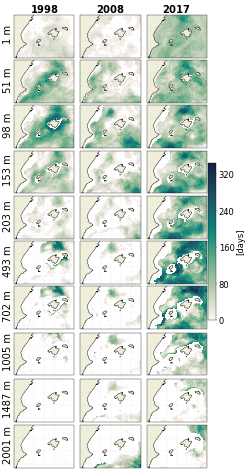

In [ ]:
# Map showing global overview of MHW stats over the years and layers

from pyscripts.basic_plotting import plot_map, subplot
from matplotlib.ticker import FuncFormatter
import roman

years = [1998,2008,2017]
depths = [1, 51, 98, 153, 203, 493, 702, 1005, 1487, 2001]
# years = [2017]
# depths = [1, 51]

for stat in [
    # 'total_scum'
    'total_days',
    # 'duration',
    # 'total_icum',
    # 'intensity_max_max',
    # 'intensity_mean_byday',
    # 'severity_mean_byday',
]:
    ncols = len(years)
    nrows = len(depths)
    title = "{stat}"

    subplots_settings = []

    for id, depth in enumerate(depths):
        for iy, year in enumerate(years):
            row = id
            col = iy

            ds = ds_mhws_medrea.sel(year=year, depth=depth, method='nearest')

            subplots_settings.append(dict(
                pos = row * ncols + col + 1,
                func = plot_map,
                lon = ds.lon,
                lat = ds.lat,
                variable_data = ds[stat],

                # Parameter of text
                title = utils.bold(year) if row == 0 else None,
                ylabel = f"{depth:.0f} m" if col == 0 else None,

                zero_to_nan = True,
                ylabel_pad = -0.02,

                # vlim = (0, 366) if stat == "duration" else None,

                left_labels = False,
                bottom_labels = False,
                xticks = 6,
                yticks = 4,
            ))

    # Finally, plot the whole figure and subplots with the desired settings !
    subplot(
        nrows, ncols,
        subplots_settings,
        
        # subplotsize = (6.9, 5),
        figsize = (8,15.6),
        figdpi = 30,
        fig_fontsize = 20,

        fig_cbar=True,
        fig_cmap = opts.mhws_stats_cmaps[stat],
        fig_cbar_unit = f"[{opts.mhws_stats_units[stat]}]",
        fig_cbar_fraction = 0.04,
        fig_cbar_pad = 0.005,

        fig_cbar_ticks = 5,

        fig_is_a_map = True,

        # fig_title = title.format(stat=opts.mhws_stats_shortname[stat]),
        show_plots = True,
    )

## Appendix 1

In [ ]:
# Map showing global overview of MHW stats over the years and layers

from pyscripts.basic_plotting import plot_map, subplot
from matplotlib.ticker import FuncFormatter
import roman

years = range(1987, 2023)
depths = [1, 51, 98, 153, 203, 493, 702, 1005, 1487, 2001]
# years = [2017]
# depths = [1, 51]

# ds = ds.compute()

for stat in [
    'total_days',
    'duration',
    'total_icum',
    'intensity_max_max',
    'intensity_mean_byday',
    'severity_mean_byday',
]:
    ncols = len(years)
    nrows = len(depths)
    title = "{stat}"

    subplots_settings = []

    for id, depth in enumerate(depths):
        for iy, year in enumerate(years):
            row = id
            col = iy

            ds = ds_mhws_medrea.sel(year=year, depth=depth, method='nearest')

            subplots_settings.append(dict(
                pos = row * ncols + col + 1,
                func = plot_map,
                # lon = [0],
                # lat = [0],
                # variable_data = [[np.nan]],
                lon = ds.lon,
                lat = ds.lat,
                variable_data = ds[stat],

                # Parameter of text
                title = year if row == 0 and (year % 2 == 0) else None,
                ylabel = f"{depth:.0f}m" if col == 0 and row % 2 == 0 else None,
                ylabel_pad=-0.08,

                zero_to_nan = True,

                # vlim = (0, 366) if stat == "duration" else None,

                left_labels = False,
                bottom_labels = False,
                xticks = 6,
                yticks = 4,
            ))

    # Finally, plot the whole figure and subplots with the desired settings !
    subplot(
        nrows, ncols,
        subplots_settings,
        
        # figsize = (20,10),
        figdpi = 30,
        # fig_fontsize = 20,
        # fig_fontsize = 40,
        fig_fontsize = 120,
        pad_subplots=(0.05,0.05),


        fig_cbar=True,
        fig_cmap = opts.mhws_stats_cmaps[stat],
        fig_cbar_unit = f"[{opts.mhws_stats_units[stat]}]",

        # fig_cbar_fraction = 0.006,
        # fig_cbar_pad = 0.003,
        # fig_cbar_orientation='verical',
        # subplotsize = (6.9, 5),

        fig_cbar_fraction = 0.05,
        fig_cbar_pad = 0.01,
        fig_cbar_orientation='horizontal',
        subplotsize = (6.6, 5),

        fig_cbar_ticks = 5,
        fig_is_a_map = True,

        show_plots = True,
    )

## Extra

### Get values

In [7]:
def get_stat(ds: xr.Dataset, stat, method=None, year=None, depth=None, region=None, ds_bathy=None):
    if 'depth' in ds.coords:
        if not depth is None:
            ds = ds.sel(depth=depth, method='nearest')
        
        else:
            return 'Depth must be specified'
    
    if region:
        if not ds_bathy:
            return "If selecting a region, ds_bathy must be provided"
        
        ds = apply_regional_mask(ds, region, ds_bathy)
    
    if method == 'mean':
        return ds[stat].mean(dim=['lon', 'lat']).mean(dim='year').item()
    
    elif method == 'std':
        return ds[stat].mean(dim=['lon', 'lat']).std(dim='year').item()
    
    elif method == 'trend':
        da = ds[stat].mean(dim=['lon', 'lat'])

        trend, h, p, z, tau, s, var_s, slope, intercept = mk.original_test(da.values, alpha=0.05)

        if h:
            return slope.item()*10
        else:
            return 'Not significant'
    
    elif year:
        return ds[stat].sel(year=year).mean(dim=['lon', 'lat']).item()
    
    else:
        return "Request couldn't get processed"

In [8]:
get_stat(ds_mhws_medrea, 'total_days', year=2020, depth=0)

121.82525390011517

In [9]:
get_stat(ds_mhws_rep, 'total_days', year=2020, depth=0)

57.63877405559516

In [ ]:
# stats = ['intensity_mean_byday']
stats = opts.mhws_basic_stats

# depths = [1,51]
depths = [0, 50, 100, 150, 200, 500, 700, 1000, 1500, 2000]

for stat in stats:
    print(opts.mhws_stats_shortname[stat], ':')
    for depth in depths:
        print(f"{depth:.0f}m: {get_stat(ds_mhws_medrea, stat, 'std', depth):.3f}")

        # if isinstance(get_stat(ds_mhws_medrea, stat, 'trend', depth), float):
        #     print(f"{get_stat(ds_mhws_medrea, stat, 'mean', depth)/get_stat(ds_mhws_medrea, stat, 'trend', depth):.2f}")

Total days :
37.8891037487691
29.366284659387304
33.645224664350174
52.34204793653285
87.86624206575013
91.6483475260327
84.2372496879168
78.03648381406464
67.854260559909
52.40110488089897
Mean duration :
7.3516460289070755
4.008165830295017
6.058266134898533
7.949730140763741
24.127001467165666
47.90196891835131
33.77046924520878
18.906768329067845
19.048993281580874
9.50992293351911
Cumulative intensity :
74.84752116502308
39.21105337104505
29.573696448110717
28.04256113970601
39.75392800548035
29.118226937546904
18.91990142258935
11.936463143662376
7.489054197536648
5.246090937068365
Maximum intensity :
0.6398683876909371
0.505802055915295
0.29943064422765225
0.14241645423132898
0.11235970688527644
0.08208812348227211
0.05739078555770348
0.03730354906075154
0.02312826548887306
0.0163857583929947
Mean intensity :
0.31927502760848764
0.3310817182517849
0.15196544996333228
0.06339110459445875
0.047368828460070296
0.03624262537819506
0.022169827394820176
0.012494446222885165
0.00828154

### ...

Making figure of 2400x800px


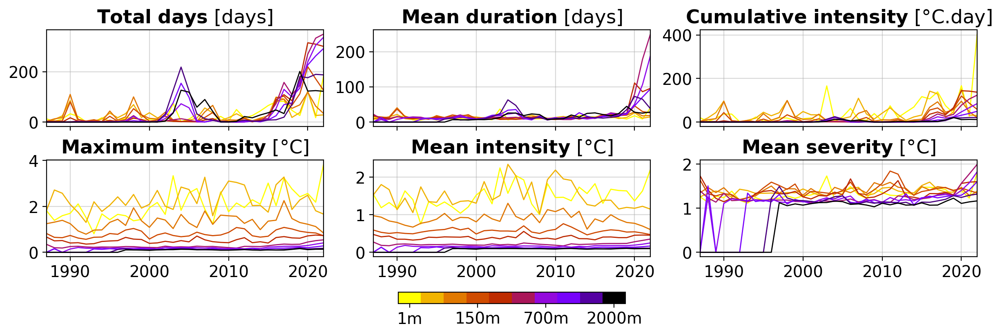

In [26]:
# Generic one

from pyscripts.basic_plotting import plot_timeserie, subplot
import math


depths = [0, 50, 100, 150, 200, 500, 700, 1000, 1500, 2000,]
# stats = [
#     'total_days',
#     'duration',
#     'total_icum',
#     'intensity_max_max',
#     'intensity_mean_byday',
#     'severity_mean_byday',
# ]
stats = opts.mhws_stats
stats = [
    'total_days',
    'duration',
    'total_icum',
    'intensity_max_max',
    'intensity_mean_byday',
    'severity_mean_byday'
]

names = {
    "total_days":           r"$\bf{Total  \ days}$ [days]",
    "duration":             r"$\bf{Mean \ duration}$ [days]",
    "total_icum":           r"$\bf{Cumulative \ intensity}$ [°C.day]",
    "intensity_max_max":    r"$\bf{Maximum \ intensity}$ [°C]",
    "intensity_mean_byday": r"$\bf{Mean \ intensity}$ [°C]",
    "severity_mean_byday": r"$\bf{Mean \ severity}$ [°C]",
}
# names = opts.mhws_stats_shortname

vlims = {
    'total_days': (0, 366),
    'duration': (0, 300),
    'total_icum': (0, 500),
    'intensity_max_max': (0, 6),
    'intensity_mean_byday': (0, 2.6),
    'severity_mean_byday': (0, 2.6),
}

cmap = 'gnuplot_r'
base_cmap = plt.get_cmap(cmap)
base_colors = base_cmap(np.linspace(0, 1, len(depths)))
cmap = ListedColormap(base_colors)
colors = cmaps(np.linspace(0, 1, len(depths)))

for i, depth in enumerate(depths):
    depths[i] = ds_mhws_medrea.sel(depth=depth, method='nearest').depth.item()



ncols = 3
nrows = math.ceil(len(stats) / ncols)

subplots_settings = []

for iss, stat in enumerate(stats):
    col = iss % ncols
    row = iss // ncols

    # cmaps = plt.get_cmap(opts.mhws_stats_cmaps[stat])
    # colors = cmaps(np.linspace(0, 1, len(depths)))

    subplots_settings.append(dict(
        pos = row * ncols + col + 1,
        func = plot_timeserie,
        vars = {
            depth: ds_mhws_medrea[stat].sel(depth=depth).mean(dim=["lon","lat"], keep_attrs=True)
            for depth in depths
        },
        times = ds_mhws_medrea.year,
        # colors = {
        #     "Continental coast": 'C0',
        #     "Balearic Islands coast": 'C1',
        #     "Balearic Sea deep": 'C2',
        #     "West Algerian Basin deep": 'C3',
        # },
        colors = {
            depth: color
            for depth, color in zip(depths, colors)
        },

        nans_to_zero=True,

        title = names[stat],
        # ylabel = fr"$\bf{{{depth:.0f}m}}$" if col == 0 else None,
        # ylabel = f'[{opts.mhws_stats_units[stat]}]',
        legend=False,
        # yticks=(3,0),
        # yticks_minor=(1,),
        # ylim=vlims[stat],

        # unit =  if (col == 0) else '',

        # left_labels = (col == 1),
        bottom_labels = (row == nrows-1),
    ))

fig = subplot(
    nrows, ncols,
    subplots_settings,

    figsize = (12, 4),
    # figsize = (4*ncols,1.28*nrows),
    # figsize = (5*ncols,1.5*nrows),
    figdpi = 200,
    fig_fontsize = 14,

    fig_cbar=True,
    fig_cmap=cmap,
    fig_vmin=0,
    fig_vmax=2000,
    fig_cbar_pad=0.05,
    fig_cbar_fraction=0.05,
    # fig_cbar_unit='Depth',
    fig_cbar_ticks=[[100, 700, 1300, 1900], ["1m", "150m", "700m", "2000m"]],
    fig_cbar_orientation='horizontal',

    show_plots = True,
)